In [1]:
import pandas as pd
import pickle
import glob
import os
from psimapacthelper import *
from datetime import datetime
import plotly.express as px
import plotly.graph_objects as go
import warnings

# Suppress specific warning
warnings.filterwarnings("ignore", category=RuntimeWarning, message="divide by zero encountered in _binom_pdf")

In [2]:
# Specify the folder path containing pickle files
folder_path = 'Calibration/final_data'

# Define the patterns to match for pickle files
file_patterns = ['datalist_original_model*.pkl']

# Initialize an empty dictionary to store loaded data
loaded_data_original = {}

# Loop through both patterns
for pattern in file_patterns:
    # Find all matching files for the current pattern
    file_paths = glob.glob(os.path.join(folder_path, pattern))
    
    # Load each pickle file
    for file_path in file_paths:
        with open(file_path, 'rb') as f:
            # Extract the seed number from the file name
            model_key = file_path.split('datalist_')[1].split('.')[0]
                    
            # Load the pickle file and store in the dictionary
            loaded_data_original[model_key] = pickle.load(f)

In [ ]:
# Specify the folder path containing pickle files
folder_path = 'Calibration/final_data'

# Define the patterns to match for pickle files
file_patterns = ['datalist_AGYW_enabled_model*.pkl']

# Initialize an empty dictionary to store loaded data
loaded_data_agyw_enabled = {}

# Loop through both patterns
for pattern in file_patterns:
    # Find all matching files for the current pattern
    file_paths = glob.glob(os.path.join(folder_path, pattern))
    
    # Load each pickle file
    for file_path in file_paths:
        with open(file_path, 'rb') as f:
            # Extract the seed number from the file name
            model_key = file_path.split('datalist_')[1].split('.')[0]
                    
            # Load the pickle file and store in the dictionary
            loaded_data_agyw_enabled[model_key] = pickle.load(f)

In [4]:
# Specify the folder path containing pickle files
folder_path = 'Calibration/final_data'

# Define the patterns to match for pickle files
file_patterns = ['datalist_AGYW_disabled_model*.pkl']

# Initialize an empty dictionary to store loaded data
loaded_data_agyw_disabled = {}

# Loop through both patterns
for pattern in file_patterns:
    # Find all matching files for the current pattern
    file_paths = glob.glob(os.path.join(folder_path, pattern))
    
    # Load each pickle file
    for file_path in file_paths:
        with open(file_path, 'rb') as f:
            # Extract the seed number from the file name
            model_key = file_path.split('datalist_')[1].split('.')[0]
                    
            # Load the pickle file and store in the dictionary
            loaded_data_agyw_disabled[model_key] = pickle.load(f)

In [ ]:
# Specify the folder path containing pickle files
folder_path = 'Calibration/final_data'

# Define the patterns to match for pickle files
file_patterns = ['datalist_AGYW_PrEP_0_model*.pkl']

# Initialize an empty dictionary to store loaded data
loaded_data_agyw_prep_0 = {}

# Loop through both patterns
for pattern in file_patterns:
    # Find all matching files for the current pattern
    file_paths = glob.glob(os.path.join(folder_path, pattern))
    
    # Load each pickle file
    for file_path in file_paths:
        with open(file_path, 'rb') as f:
            # Extract the seed number from the file name
            model_key = file_path.split('datalist_')[1].split('.')[0]
                    
            # Load the pickle file and store in the dictionary
            loaded_data_agyw_prep_0[model_key] = pickle.load(f)

In [5]:
loaded_data_original.keys()

dict_keys(['original_model_1_seed_11', 'original_model_1_seed_4', 'original_model_1_seed_15', 'original_model_1_seed_13', 'original_model_1_seed_5', 'original_model_1_seed_7', 'original_model_1_seed_3', 'original_model_1_seed_1', 'original_model_1_seed_10', 'original_model_1_seed_20', 'original_model_1_seed_6', 'original_model_1_seed_8', 'original_model_1_seed_19', 'original_model_1_seed_12', 'original_model_1_seed_18', 'original_model_1_seed_2', 'original_model_1_seed_14', 'original_model_1_seed_9', 'original_model_1_seed_17', 'original_model_1_seed_16'])

In [6]:
agegroup = [15, 50]
evaluation_timepoints = np.arange(1, 71.0, 1.0) # 

# Define mapping from gender and timepoint to years,
gender = {
    0: 'Men',
    1: 'Women',
    'Total':'Total'}

timepoint_to_year = {timepoint: year for timepoint, year in enumerate(range(1980, 2051))}

In [11]:
sim_size = 2000
scaling_factor = 611454/sim_size

# Population size 15-49

In [12]:
original_periodiclog = loaded_data_original['original_model_1_seed_4']['ltable']
original_periodiclog

,Time,PopSize,InTreatment
0,0.25,1990,0
1,0.50,1985,0
2,0.75,1979,0
3,1.00,1980,0
4,1.25,1987,0
...,...,...,...
279,70.00,4622,295
280,70.25,4634,293
281,70.50,4638,286
282,70.75,4660,284


In [14]:
# compare populations size original model
# Initialize an empty list to store individual dataframes
dfs = []

for key, datalist in loaded_data_original.items():
    for timepoint in evaluation_timepoints:
        # agegroup = [15, 50]
        result_df = pop_size_calculator(datalist=datalist, agegroup=agegroup,timepoint=timepoint)
        result_df['timepoint'] = timepoint-1 
        result_df['model'] = key

        # Append the resulting dataframe to the list
        dfs.append(result_df)

# Concatenate all dataframes in the list into a single dataframe
pop_combined_df = pd.concat(dfs, ignore_index=True)

# Replace timepoint with years, gender with actual gender string
pop_combined_df['Year'] = pop_combined_df['timepoint'].map(timepoint_to_year)
pop_combined_df['Gender'] = pop_combined_df['Gender'].map(gender)
pop_combined_df['popsize_y'] = pop_combined_df['popsize_y']*scaling_factor

population_wide_df = pop_combined_df.pivot(index=['model','Year'], columns='Gender', values='popsize_y').reset_index()
population_wide_df

Gender,model,Year,Men,Total,Women
0,original_model_1_seed_1,1980,150417.684,284326.110,133908.426
1,original_model_1_seed_1,1981,154697.862,290134.923,135437.061
2,original_model_1_seed_1,1982,157449.405,301141.095,143691.690
3,original_model_1_seed_1,1983,161729.583,310924.359,149194.776
4,original_model_1_seed_1,1984,166315.488,321624.804,155309.316
...,...,...,...,...,...
1395,original_model_1_seed_9,2045,334465.338,657924.504,323459.166
1396,original_model_1_seed_9,2046,336911.154,662510.409,325599.255
1397,original_model_1_seed_9,2047,338134.062,668930.676,330796.614
1398,original_model_1_seed_9,2048,336605.427,669236.403,332630.976


In [15]:
mean_time_series = population_wide_df.groupby('Year')['Total'].mean().reset_index()

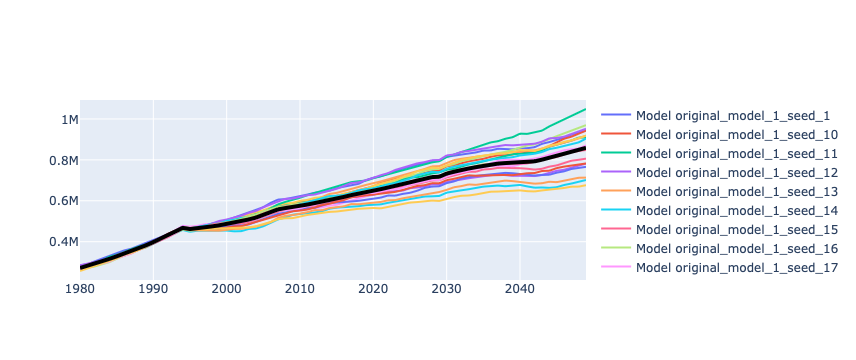

In [16]:
fig = go.Figure()

# Add the original time series for each model
for model in population_wide_df['model'].unique():
    model_data = population_wide_df[population_wide_df['model'] == model]
    fig.add_trace(
        go.Scatter(
            x=model_data['Year'],
            y=model_data['Total'],
            mode='lines',
            name=f'Model {model}',
            line=dict(width=2)
        )
    )

# Add the mean time series trace
fig.add_trace(
    go.Scatter(
        x=mean_time_series['Year'],
        y=mean_time_series['Total'],
        mode='lines',
        name='Mean',
        line=dict(color='black', width=4)
    )
)

# Show the plot
fig.show()

In [17]:
# compare populations size AGYW disabled model
# Initialize an empty list to store individual dataframes
dfs = []

for key, datalist in loaded_data_agyw_disabled.items():
    for timepoint in evaluation_timepoints:
        # agegroup = [15, 50]
        result_df = pop_size_calculator(datalist=datalist, agegroup=agegroup,timepoint=timepoint)
        result_df['timepoint'] = timepoint-1 
        result_df['model'] = key

        # Append the resulting dataframe to the list
        dfs.append(result_df)

# Concatenate all dataframes in the list into a single dataframe
pop_combined_df = pd.concat(dfs, ignore_index=True)

# Replace timepoint with years, gender with actual gender string
pop_combined_df['Year'] = pop_combined_df['timepoint'].map(timepoint_to_year)
pop_combined_df['Gender'] = pop_combined_df['Gender'].map(gender)
pop_combined_df['popsize_y'] = pop_combined_df['popsize_y']*scaling_factor

population_wide_df = pop_combined_df.pivot(index=['model','Year'], columns='Gender', values='popsize_y').reset_index()
population_wide_df

Gender,model,Year,Men,Total,Women
0,AGYW_disabled_model_1_seed_1,1980,150417.684,284326.110,133908.426
1,AGYW_disabled_model_1_seed_1,1981,154697.862,290134.923,135437.061
2,AGYW_disabled_model_1_seed_1,1982,157449.405,301141.095,143691.690
3,AGYW_disabled_model_1_seed_1,1983,161729.583,310924.359,149194.776
4,AGYW_disabled_model_1_seed_1,1984,166315.488,321624.804,155309.316
...,...,...,...,...,...
1395,AGYW_disabled_model_1_seed_9,2045,354643.320,717235.542,362592.222
1396,AGYW_disabled_model_1_seed_9,2046,355254.774,719987.085,364732.311
1397,AGYW_disabled_model_1_seed_9,2047,356171.955,726713.079,370541.124
1398,AGYW_disabled_model_1_seed_9,2048,359229.225,734967.708,375738.483


In [18]:
mean_time_series = population_wide_df.groupby('Year')['Total'].mean().reset_index()

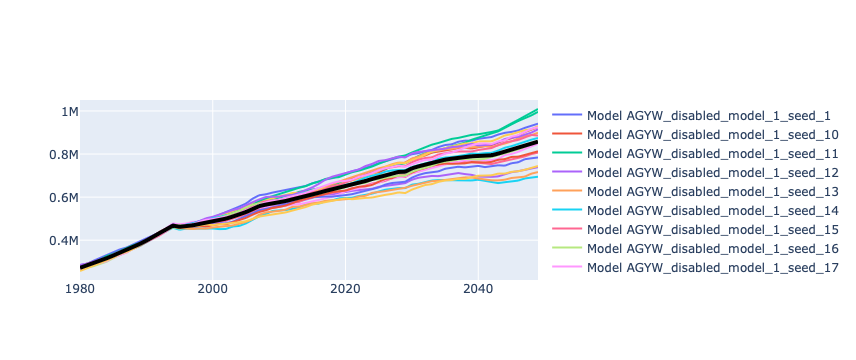

In [19]:
fig = go.Figure()

# Add the original time series for each model
for model in population_wide_df['model'].unique():
    model_data = population_wide_df[population_wide_df['model'] == model]
    fig.add_trace(
        go.Scatter(
            x=model_data['Year'],
            y=model_data['Total'],
            mode='lines',
            name=f'Model {model}',
            line=dict(width=2)
        )
    )

# Add the mean time series trace
fig.add_trace(
    go.Scatter(
        x=mean_time_series['Year'],
        y=mean_time_series['Total'],
        mode='lines',
        name='Mean',
        line=dict(color='black', width=4)
    )
)

# Show the plot
fig.show()

In [21]:
# compare populations size AGYW enabled model
# Initialize an empty list to store individual dataframes
dfs = []

for key, datalist in loaded_data_agyw_enabled.items():
    for timepoint in evaluation_timepoints:
        # agegroup = [15, 50]
        result_df = pop_size_calculator(datalist=datalist, agegroup=agegroup,timepoint=timepoint)
        result_df['timepoint'] = timepoint-1 
        result_df['model'] = key

        # Append the resulting dataframe to the list
        dfs.append(result_df)

# Concatenate all dataframes in the list into a single dataframe
pop_combined_df = pd.concat(dfs, ignore_index=True)

# Replace timepoint with years, gender with actual gender string
pop_combined_df['Year'] = pop_combined_df['timepoint'].map(timepoint_to_year)
pop_combined_df['Gender'] = pop_combined_df['Gender'].map(gender)
pop_combined_df['popsize_y'] = pop_combined_df['popsize_y']*scaling_factor

population_wide_df = pop_combined_df.pivot(index=['model','Year'], columns='Gender', values='popsize_y').reset_index()
population_wide_df

Gender,model,Year,Men,Total,Women
0,AGYW_enabled_model_1_seed_1,1980,150417.684,284326.110,133908.426
1,AGYW_enabled_model_1_seed_1,1981,154697.862,290134.923,135437.061
2,AGYW_enabled_model_1_seed_1,1982,157449.405,301141.095,143691.690
3,AGYW_enabled_model_1_seed_1,1983,161729.583,310924.359,149194.776
4,AGYW_enabled_model_1_seed_1,1984,166315.488,321624.804,155309.316
...,...,...,...,...,...
1395,AGYW_enabled_model_1_seed_9,2045,339051.243,672599.400,333548.157
1396,AGYW_enabled_model_1_seed_9,2046,338439.789,674433.762,335993.973
1397,AGYW_enabled_model_1_seed_9,2047,345165.783,686662.842,341497.059
1398,AGYW_enabled_model_1_seed_9,2048,347611.599,694611.744,347000.145


In [22]:
mean_time_series = population_wide_df.groupby('Year')['Total'].mean().reset_index()

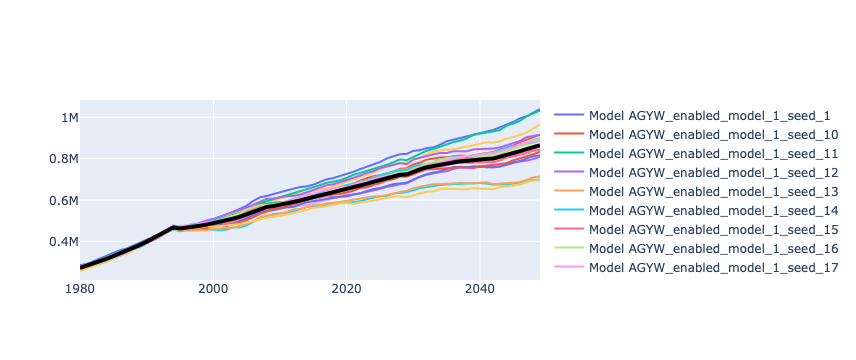

In [23]:
fig = go.Figure()

# Add the original time series for each model
for model in population_wide_df['model'].unique():
    model_data = population_wide_df[population_wide_df['model'] == model]
    fig.add_trace(
        go.Scatter(
            x=model_data['Year'],
            y=model_data['Total'],
            mode='lines',
            name=f'Model {model}',
            line=dict(width=2)
        )
    )

# Add the mean time series trace
fig.add_trace(
    go.Scatter(
        x=mean_time_series['Year'],
        y=mean_time_series['Total'],
        mode='lines',
        name='Mean',
        line=dict(color='black', width=4)
    )
)

# Show the plot
fig.show()

# Number on treatment

In [31]:
dfs = []

for key, datalist in loaded_data_original.items():
    for timepoint in evaluation_timepoints:
        # agegroup = [15, 50]
        result_df = datalist['ltable']
        result_df['model'] = key

        # Append the resulting dataframe to the list
        dfs.append(result_df)

# Concatenate all dataframes in the list into a single dataframe
ltable_original = pd.concat(dfs, ignore_index=True)
ltable_original['PopSize'] = ltable_original['PopSize']*scaling_factor
ltable_original['InTreatment'] = ltable_original['InTreatment']*scaling_factor
ltable_original['Year'] = ltable_original['Time'].map(timepoint_to_year)
ltable_original.dropna(subset=['Year'], inplace=True)

In [32]:
ltable_original

,Time,PopSize,InTreatment,model,Year
3,1.0,608396.730,0.000,original_model_1_seed_11,1981.0
7,2.0,614205.543,0.000,original_model_1_seed_11,1982.0
11,3.0,620625.810,0.000,original_model_1_seed_11,1983.0
15,4.0,635606.433,0.000,original_model_1_seed_11,1984.0
19,5.0,647529.786,0.000,original_model_1_seed_11,1985.0
...,...,...,...,...,...
397579,66.0,1731637.728,50139.228,original_model_1_seed_16,2046.0
397583,67.0,1758541.704,47387.685,original_model_1_seed_16,2047.0
397587,68.0,1784834.226,42496.053,original_model_1_seed_16,2048.0
397591,69.0,1813572.564,38827.329,original_model_1_seed_16,2049.0


In [35]:
mean_time_series = ltable_original.groupby('Year')['InTreatment'].mean().reset_index()

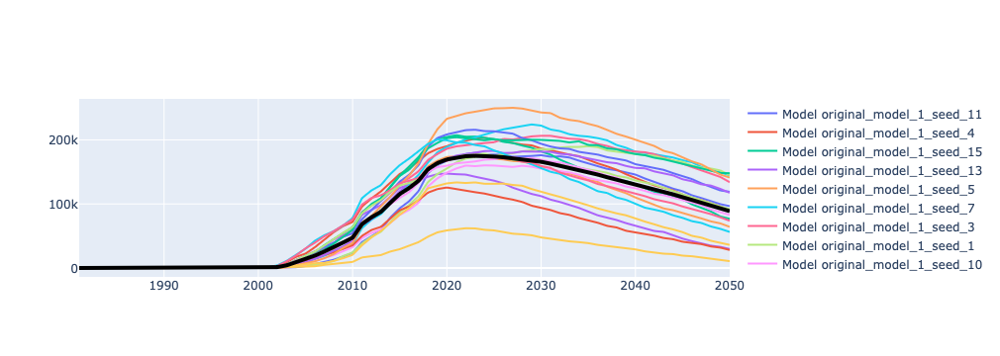

In [36]:
fig = go.Figure()

# Add the original time series for each model
for model in ltable_original['model'].unique():
    model_data = ltable_original[ltable_original['model'] == model].sort_values(by='Time')
    fig.add_trace(
        go.Scatter(
            x=model_data['Year'],
            y=model_data['InTreatment'],
            mode='lines',
            name=f'Model {model}',
            line=dict(width=2)
        )
    )

# Add the mean time series trace
fig.add_trace(
    go.Scatter(
        x=mean_time_series['Year'],
        y=mean_time_series['InTreatment'],
        mode='lines',
        name='Mean',
        line=dict(color='black', width=4)
    )
)

# Show the plot
fig.show()

In [37]:
dfs = []

for key, datalist in loaded_data_agyw_disabled.items():
    for timepoint in evaluation_timepoints:
        # agegroup = [15, 50]
        result_df = datalist['ltable']
        result_df['model'] = key

        # Append the resulting dataframe to the list
        dfs.append(result_df)

# Concatenate all dataframes in the list into a single dataframe
ltable_agyw_disabled = pd.concat(dfs, ignore_index=True)
ltable_agyw_disabled['PopSize'] = ltable_agyw_disabled['PopSize']*scaling_factor
ltable_agyw_disabled['InTreatment'] = ltable_agyw_disabled['InTreatment']*scaling_factor
ltable_agyw_disabled['Year'] = ltable_agyw_disabled['Time'].map(timepoint_to_year)
ltable_agyw_disabled.dropna(subset=['Year'], inplace=True)

In [38]:
mean_time_series = ltable_agyw_disabled.groupby('Year')['InTreatment'].mean().reset_index()

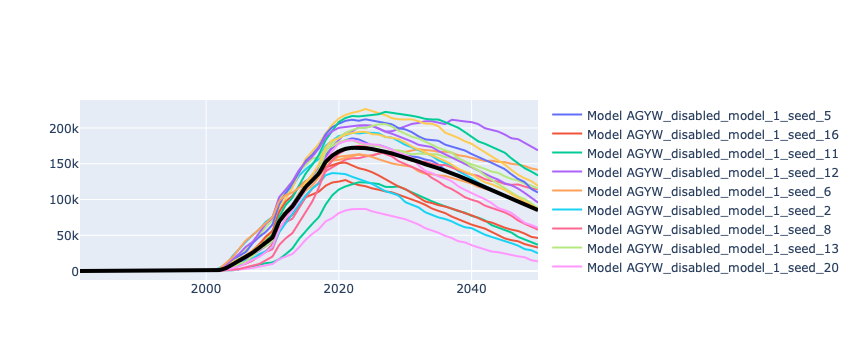

In [40]:
fig = go.Figure()

# Add the original time series for each model
for model in ltable_agyw_disabled['model'].unique():
    model_data = ltable_agyw_disabled[ltable_agyw_disabled['model'] == model].sort_values(by='Time')
    fig.add_trace(
        go.Scatter(
            x=model_data['Year'],
            y=model_data['InTreatment'],
            mode='lines',
            name=f'Model {model}',
            line=dict(width=2)
        )
    )

# Add the mean time series trace
fig.add_trace(
    go.Scatter(
        x=mean_time_series['Year'],
        y=mean_time_series['InTreatment'],
        mode='lines',
        name='Mean',
        line=dict(color='black', width=4)
    )
)

# Show the plot
fig.show()

In [54]:
dfs = []

for key, datalist in loaded_data_agyw_enabled.items():
    for timepoint in evaluation_timepoints:
        # agegroup = [15, 50]
        result_df = datalist['ltable']
        result_df['model'] = key

        # Append the resulting dataframe to the list
        dfs.append(result_df)

# Concatenate all dataframes in the list into a single dataframe
ltable_agyw_enabled = pd.concat(dfs, ignore_index=True)
ltable_agyw_enabled['PopSize'] = ltable_agyw_enabled['PopSize']*scaling_factor
ltable_agyw_enabled['InTreatment'] = ltable_agyw_enabled['InTreatment']*scaling_factor
ltable_agyw_enabled['Year'] = ltable_agyw_enabled['Time'].map(timepoint_to_year)
ltable_agyw_enabled.dropna(subset=['Year'], inplace=True)

In [60]:
mean_time_series = ltable_agyw_enabled.groupby('Time')['InTreatment'].mean().reset_index()

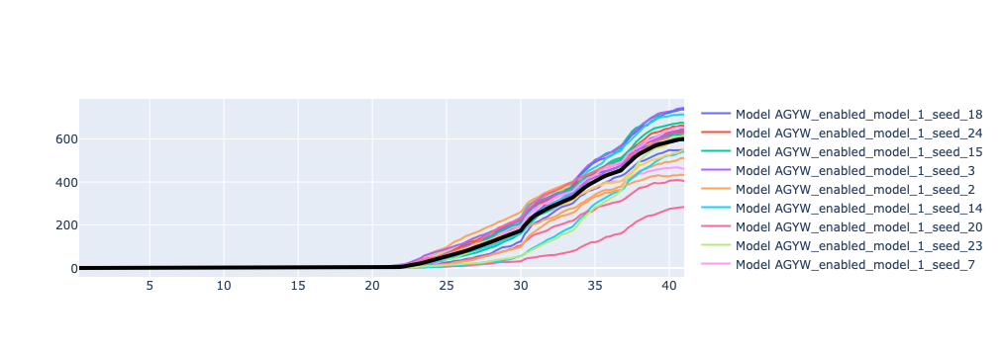

In [65]:
fig = go.Figure()

# Add the original time series for each model
for model in ltable_agyw_enabled['model'].unique():
    model_data = ltable_agyw_enabled[ltable_agyw_enabled['model'] == model].sort_values(by='Time')
    fig.add_trace(
        go.Scatter(
            x=model_data['Time'],
            y=model_data['InTreatment'],
            mode='lines',
            name=f'Model {model}',
            line=dict(width=2)
        )
    )

# Add the mean time series trace
fig.add_trace(
    go.Scatter(
        x=mean_time_series['Time'],
        y=mean_time_series['InTreatment'],
        mode='lines',
        name='Mean',
        line=dict(color='black', width=4)
    )
)

# Show the plot
fig.show()

# Number diagnosed

In [ ]:
# compare populations size original model
# Initialize an empty list to store individual dataframes
dfs = []

for key, datalist in loaded_data_original.items():
    for timepoint in evaluation_timepoints:
        agegroup = [15, 25]
        result_df = proportion_diagnosed_calculator(datalist=datalist, agegroup=agegroup,timepoint=timepoint)
        result_df['timepoint'] = timepoint-1 
        result_df['model'] = key

        # Append the resulting dataframe to the list
        dfs.append(result_df)

# Concatenate all dataframes in the list into a single dataframe
prev_diag_combined_df = pd.concat(dfs, ignore_index=True)

# Replace timepoint with years, gender with actual gender string
prev_diag_combined_df['Year'] = prev_diag_combined_df['timepoint'].map(timepoint_to_year)
prev_diag_combined_df['Gender'] = prev_diag_combined_df['Gender'].map(gender)
prev_diag_combined_df['sum_diagnosed'] = prev_diag_combined_df['sum_diagnosed']*scaling_factor

number_diagnosed_wide_df = prev_diag_combined_df.pivot(index=['model','Year'], columns='Gender', values='sum_diagnosed').reset_index()

mean_time_series = number_diagnosed_wide_df.groupby('Year')['Total'].mean().reset_index()

fig = go.Figure()

# Add the original time series for each model
for model in number_diagnosed_wide_df['model'].unique():
    model_data = number_diagnosed_wide_df[number_diagnosed_wide_df['model'] == model]
    fig.add_trace(
        go.Scatter(
            x=model_data['Year'],
            y=model_data['Total'],
            mode='lines',
            name=f'Model {model}',
            line=dict(width=2)
        )
    )

# Add the mean time series trace
fig.add_trace(
    go.Scatter(
        x=mean_time_series['Year'],
        y=mean_time_series['Total'],
        mode='lines',
        name='Mean',
        line=dict(color='black', width=4)
    )
)

# Show the plot
fig.show()

# PrEP Users

In [ ]:
# compare populations size original model
# Initialize an empty list to store individual dataframes
dfs = []

for key, datalist in loaded_data_agyw_prep_0_3.items():
    for timepoint in evaluation_timepoints:
        agegroup = [15, 25]
        result_df = prep_users_calculator_ever(datalist=datalist, agegroup=agegroup,timepoint=timepoint)
        result_df['timepoint'] = timepoint-1 
        result_df['model'] = key

        # Append the resulting dataframe to the list
        dfs.append(result_df)

# Concatenate all dataframes in the list into a single dataframe
prep_users_combined_df = pd.concat(dfs, ignore_index=True)
prep_users_combined_df.head()

# Replace timepoint with years, gender with actual gender string
prep_users_combined_df['Year'] = prep_users_combined_df['timepoint'].map(timepoint_to_year)
prep_users_combined_df['Gender'] = prep_users_combined_df['Gender'].map(gender)
# prep_users_combined_df['sum_diagnosed'] = prep_users_combined_df['sum_diagnosed']*scaling_factor

prep_users_combined_df_wide_df = prep_users_combined_df.pivot(index=['model','Year'], columns='Gender', values='prep_users_prevalence').reset_index()

mean_time_series = prep_users_combined_df_wide_df.groupby('Year')['Total'].mean().reset_index()

fig = go.Figure()

# Add the original time series for each model
for model in prep_users_combined_df_wide_df['model'].unique():
    model_data = prep_users_combined_df_wide_df[prep_users_combined_df_wide_df['model'] == model]
    fig.add_trace(
        go.Scatter(
            x=model_data['Year'],
            y=model_data['Total'],
            mode='lines',
            name=f'Model {model}',
            line=dict(width=2)
        )
    )

# Add the mean time series trace
fig.add_trace(
    go.Scatter(
        x=mean_time_series['Year'],
        y=mean_time_series['Total'],
        mode='lines',
        name='Mean',
        line=dict(color='black', width=4)
    )
)

# Show the plot
fig.show()